# DCT Steganography - Data Embedding in Images
This notebook hides a secret message inside an image using the **Discrete Cosine Transform (DCT)** technique.
Run each block (cell) in order, from top to bottom.

In [ ]:
import sys
!{sys.executable} -m pip install jpegio

In [2]:
import sys
!{sys.executable} -m pip install reedsolo

In [3]:
# ============================================================
# BLOCK 1: Install required libraries
# Run this block ONCE the first time you set up the environment
# ============================================================
import sys
!{sys.executable} -m pip install numpy opencv-python scipy Pillow

In [4]:
# ============================================================
# BLOCK 2: Import libraries
# ============================================================
import numpy as np                        # numerical operations
import cv2                                # image read/write
from scipy.fftpack import dct, idct       # DCT and inverse DCT
from PIL import Image                     # image display inside notebook
import matplotlib.pyplot as plt           # plotting
import os
import jpegio
print(dir(jpegio))

print('All libraries imported successfully!')

['ComponentInfo', 'DECOMPRESSED', 'DecompressedJpeg', 'Flag', 'ZIGZAG_DCT_1D', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'componentinfo', 'decompressedjpeg', 'flags', 'io', 'read', 'write']
All libraries imported successfully!


In [5]:
# ============================================================
# BLOCK 3: Constants and helpers
# ============================================================
import numpy as np
import cv2
from scipy.fftpack import dct, idct

# We embed by comparing TWO coefficients instead of using remainder.
# Bit=1: force coeff_A > coeff_B by at least DELTA
# Bit=0: force coeff_A < coeff_B by at least DELTA
COEFF_A = (1, 2)   # Q value = 5  at quality 75
COEFF_B = (2, 1)   # second coefficient position
DELTA = 80         # minimum difference to enforce between the two coefficients

def text_to_bits(text):
    bits = []
    for char in text:
        byte = ord(char)
        for i in range(7, -1, -1):
            bits.append((byte >> i) & 1)
    return bits

def bits_to_text(bits):
    chars = []
    for i in range(0, len(bits), 8):
        byte = bits[i:i+8]
        if len(byte) < 8:
            break
        value = int(''.join(str(b) for b in byte), 2)
        chars.append(chr(value))
    return ''.join(chars)

def apply_dct_block(block):
    return dct(dct(block.T, norm='ortho').T, norm='ortho')

def apply_idct_block(block):
    return idct(idct(block.T, norm='ortho').T, norm='ortho')

print('Block 3 ready. COEFF_A =', COEFF_A, '| COEFF_B =', COEFF_B, '| DELTA =', DELTA)


Block 3 ready. COEFF_A = (1, 2) | COEFF_B = (2, 1) | DELTA = 80


In [6]:
# ============================================================
# BLOCK 3.5: Error Correction (Reed-Solomon)
# pip install reedsolo
# ============================================================
from reedsolo import RSCodec

# nsym=20 means we can recover from up to 10 corrupted bytes
# Increase nsym for more robustness (but reduces capacity)
RS_NSYM = 40
rsc = RSCodec(RS_NSYM)

def encode_with_ecc(message: str) -> list:
    """Encode message string → ECC-protected bits"""
    raw_bytes = message.encode('utf-8')
    encoded_bytes = bytes(rsc.encode(raw_bytes))  # adds RS parity bytes
    bits = []
    for byte in encoded_bytes:
        for i in range(7, -1, -1):
            bits.append((byte >> i) & 1)
    return bits

def decode_with_ecc(bits: list) -> str:
    """Decode ECC-protected bits → message string (corrects errors)"""
    # Pad bits to full bytes
    while len(bits) % 8 != 0:
        bits.append(0)
    byte_array = bytearray()
    for i in range(0, len(bits), 8):
        byte_array.append(int(''.join(str(b) for b in bits[i:i+8]), 2))
    try:
        decoded_bytes, _, _ = rsc.decode(bytes(byte_array))
        return decoded_bytes.decode('utf-8')
    except Exception as e:
        return f"[ECC failed: {e}]"

In [7]:
# ============================================================
# BLOCK 4 (v5): Crop to multiple of 8, then embed
# ============================================================

def embed_message(image_path, message, output_path):

    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f'Cannot open image: {image_path}')

    img = np.clip(img, 0, 255).astype(np.uint8)

    # Crop width and height to nearest multiple of 8
    # This eliminates any leftover pixel columns/rows that cause block misalignment
    h, w = img.shape[:2]
    new_h = (h // 8) * 8
    new_w = (w // 8) * 8
    img = img[0:new_h, 0:new_w]
    print(f'Cropped image from {w}x{h} to {new_w}x{new_h}')

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)
    Cr = Cr.astype(np.uint8)
    Cb = Cb.astype(np.uint8)
    Y  = Y.astype(np.float64)

    bits = encode_with_ecc(message)
    total_bits = len(bits)

    height, width = Y.shape
    blocks_v = height // 8
    blocks_h = width // 8
    total_blocks = blocks_v * blocks_h

    print(f'Total blocks      : {total_blocks}')
    print(f'Bits to embed     : {total_bits}')
    print(f'Max characters    : {total_blocks // 8}')

    if total_bits > total_blocks:
        raise ValueError(f'Message too long! Max chars: {total_blocks // 8}')

    ra, ca = COEFF_A
    rb, cb = COEFF_B
    bit_index = 0

    for row in range(blocks_v):
        for col in range(blocks_h):
            if bit_index >= total_bits:
                break

            r = row * 8
            c = col * 8
            block = Y[r:r+8, c:c+8].copy()
            dct_block = apply_dct_block(block)

            a = dct_block[ra, ca]
            b = dct_block[rb, cb]
            mid = (a + b) / 2.0

            if bits[bit_index] == 1:
                dct_block[ra, ca] = mid + DELTA / 2
                dct_block[rb, cb] = mid - DELTA / 2
            else:
                dct_block[ra, ca] = mid - DELTA / 2
                dct_block[rb, cb] = mid + DELTA / 2

            Y[r:r+8, c:c+8] = apply_idct_block(dct_block)
            bit_index += 1

    Y_uint8 = np.clip(Y, 0, 255).astype(np.uint8)
    stego_ycrcb = cv2.merge([Y_uint8, Cr, Cb])
    stego_bgr   = cv2.cvtColor(stego_ycrcb, cv2.COLOR_YCrCb2BGR)

    ok = cv2.imwrite(output_path, stego_bgr)
    print(f'Saved: {output_path}  |  Success: {ok}')
    return stego_bgr

print('embed_message() v5 defined.')

embed_message() v5 defined.


In [8]:
# ============================================================
# BLOCK 5 (v6): Extract with ECC
# ============================================================

def extract_message(stego_image_path, message_length):

    img = cv2.imread(stego_image_path)
    if img is None:
        raise FileNotFoundError(f'Cannot open image: {stego_image_path}')

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, _, _ = cv2.split(img_ycrcb)
    Y = Y.astype(np.float64)

    height, width = Y.shape
    blocks_v = height // 8
    blocks_h = width // 8

    ra, ca = COEFF_A
    rb, cb = COEFF_B

    # ── HERE is where those two lines go ──────────────────────
    encoded_length = len(rsc.encode(b'x' * message_length))  # how many bytes RS will produce
    total_bits = encoded_length * 8                           # how many bits to collect
    # ──────────────────────────────────────────────────────────

    bits = []

    for row in range(blocks_v):
        for col in range(blocks_h):
            if len(bits) >= total_bits:   # stop once we have enough
                break

            r = row * 8
            c = col * 8
            block = Y[r:r+8, c:c+8].copy()
            dct_block = apply_dct_block(block)

            if dct_block[ra, ca] > dct_block[rb, cb]:
                bits.append(1)
            else:
                bits.append(0)

        if len(bits) >= total_bits:
            break

    return decode_with_ecc(bits)

def extract_message_raw(stego_image_path, message_length):
    """Extract without ECC — shows the raw damaged message for analysis."""
    img = cv2.imread(stego_image_path)
    if img is None:
        return '[cannot read image]'

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, _, _ = cv2.split(img_ycrcb)
    Y = Y.astype(np.float64)

    height, width = Y.shape
    blocks_v = height // 8
    blocks_h = width // 8

    ra, ca = COEFF_A
    rb, cb = COEFF_B

    total_bits = message_length * 8  # just the message, no ECC overhead
    bits = []

    for row in range(blocks_v):
        for col in range(blocks_h):
            if len(bits) >= total_bits:
                break
            r = row * 8
            c = col * 8
            block = Y[r:r+8, c:c+8].copy()
            dct_block = apply_dct_block(block)
            bits.append(1 if dct_block[ra, ca] > dct_block[rb, cb] else 0)
        if len(bits) >= total_bits:
            break

    return bits_to_text(bits)

In [9]:
# ============================================================
# BLOCK 7: EMBED your secret message
# --> Edit the variables below before running <--
# ============================================================

COVER_IMAGE_PATH  = 'cover_image.png'   # <-- path to your cover image
SECRET_MESSAGE    = 'Hello, this is a secret message hidden with DCT and i am trying to hide it from must'  # <-- your message
STEGO_IMAGE_PATH  = 'stego1_image.png'   # <-- output stego image path

# Run the embedding
stego = embed_message(
    image_path  = COVER_IMAGE_PATH,
    message     = SECRET_MESSAGE,
    output_path = STEGO_IMAGE_PATH
)

print('\nEmbedding complete!')

Cropped image from 1313x736 to 1312x736
Total blocks      : 15088
Bits to embed     : 992
Max characters    : 1886
Saved: stego1_image.png  |  Success: True

Embedding complete!


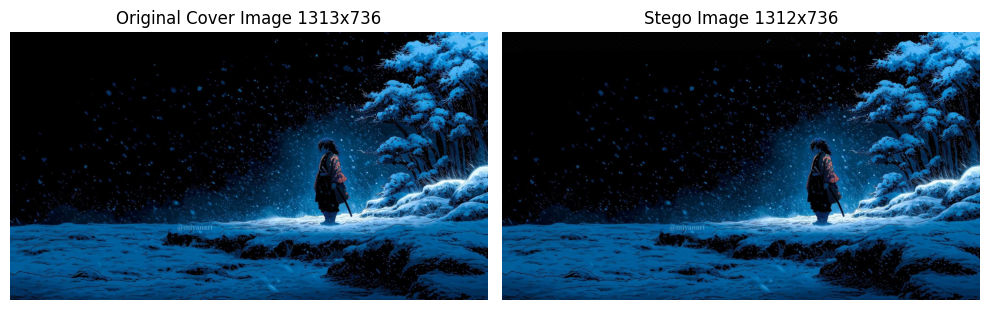

PSNR: 45.07 dB  (> 40 dB means distortion is imperceptible)


In [10]:
# ============================================================
# BLOCK 8 (v2): Visual comparison - handles cropped stego image
# ============================================================

cover = cv2.cvtColor(cv2.imread(COVER_IMAGE_PATH), cv2.COLOR_BGR2RGB)
stego_display = cv2.cvtColor(cv2.imread(STEGO_IMAGE_PATH), cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(cover)
axes[0].set_title(f'Original Cover Image {cover.shape[1]}x{cover.shape[0]}')
axes[0].axis('off')

axes[1].imshow(stego_display)
axes[1].set_title(f'Stego Image {stego_display.shape[1]}x{stego_display.shape[0]}')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Crop cover to same size as stego before PSNR calculation
h, w = stego_display.shape[:2]
cover_cropped = cover[0:h, 0:w]

mse = np.mean((cover_cropped.astype(float) - stego_display.astype(float)) ** 2)
if mse == 0:
    print('PSNR: Infinity (images are identical)')
else:
    psnr = 10 * np.log10((255 ** 2) / mse)
    print(f'PSNR: {psnr:.2f} dB  (> 40 dB means distortion is imperceptible)')

In [11]:
# ============================================================
# BLOCK 9: EXTRACT the hidden message from the stego image
# ============================================================

recovered = extract_message(STEGO_IMAGE_PATH, len(SECRET_MESSAGE))

print(f'Extracted message: "{recovered}"')
print()
if recovered == SECRET_MESSAGE:
    print('SUCCESS: Extracted message matches the original!')
else:
    print('WARNING: Messages do not match. Check QUANTIZATION_STEP or image compression.')

Extracted message: "Hello, this is a secret message hidden with DCT and i am trying to hide it from must"

SUCCESS: Extracted message matches the original!


In [12]:
# ============================================================
# BLOCK 10: Attack functions
# Each function takes the stego image path, applies an attack,
# saves the attacked image, and returns the saved path.
# ============================================================
import cv2
import numpy as np
import os

# --- Helper: calculate PSNR between original stego and attacked version ---
def calc_psnr(img1_path, img2_path):
    """
    Peak Signal-to-Noise Ratio between two images.
    Higher = less visual distortion.
    > 40 dB = imperceptible to humans.
    """
    a = cv2.imread(img1_path).astype(np.float64)
    b = cv2.imread(img2_path).astype(np.float64)

    # Crop both to same size in case of size mismatch after attack
    h = min(a.shape[0], b.shape[0])
    w = min(a.shape[1], b.shape[1])
    a, b = a[:h, :w], b[:h, :w]

    mse = np.mean((a - b) ** 2)
    if mse == 0:
        return float('inf')
    return 10 * np.log10((255 ** 2) / mse)


# --- Helper: compare extracted message to original ---
def evaluate(extracted, original):
    """
    Returns (survived, corrupted_chars, total_chars)
    survived       : True if message extracted perfectly
    corrupted_chars: number of wrong characters
    total_chars    : length of original message
    """
    total = len(original)
    if not extracted:
        return False, total, total
    corrupted = sum(1 for a, b in zip(original, extracted) if a != b)
    corrupted += abs(len(original) - len(extracted))  # length difference counts too
    survived = (corrupted == 0)
    return survived, corrupted, total


# ============================================================
# ATTACK 1: JPEG Compression
# Saves the stego image as JPEG at different quality levels
# then reloads it as PNG. This is the most destructive attack
# because JPEG re-quantizes DCT coefficients.
# ============================================================
def attack_jpeg(stego_path, quality, output_path):
    img = cv2.imread(stego_path)
    # Save as JPEG with the given quality (100=best, 1=worst)
    temp_jpg = output_path.replace('.png', '_temp.jpg')
    cv2.imwrite(temp_jpg, img, [cv2.IMWRITE_JPEG_QUALITY, quality])
    # Reload the JPEG and save back as PNG for extraction
    reloaded = cv2.imread(temp_jpg)
    cv2.imwrite(output_path, reloaded)
    os.remove(temp_jpg)  # clean up temp file
    return output_path


# ============================================================
# ATTACK 2: Gaussian Noise
# Adds random pixel noise sampled from a Gaussian distribution.
# Simulates a noisy transmission channel.
# ============================================================
def attack_gaussian_noise(stego_path, std, output_path):
    img = cv2.imread(stego_path).astype(np.float64)
    # Generate noise with mean=0 and the given standard deviation
    noise = np.random.normal(0, std, img.shape)
    noisy = np.clip(img + noise, 0, 255).astype(np.uint8)
    cv2.imwrite(output_path, noisy)
    return output_path


# ============================================================
# ATTACK 3: Resizing
# Scales the image down then back up to original size.
# Interpolation during resize changes pixel values.
# ============================================================
def attack_resize(stego_path, scale_factor, output_path):
    img = cv2.imread(stego_path)
    h, w = img.shape[:2]
    # Scale down
    small_w = int(w * scale_factor)
    small_h = int(h * scale_factor)
    small = cv2.resize(img, (small_w, small_h), interpolation=cv2.INTER_LINEAR)
    # Scale back up to original size
    restored = cv2.resize(small, (w, h), interpolation=cv2.INTER_LINEAR)
    cv2.imwrite(output_path, restored)
    return output_path


# ============================================================
# ATTACK 4: Rotation
# Rotates the image by a small angle then rotates back.
# Even tiny rotations desync the 8x8 block grid.
# ============================================================
def attack_rotation(stego_path, angle, output_path):
    img = cv2.imread(stego_path)
    h, w = img.shape[:2]
    center = (w // 2, h // 2)
    # Rotate by +angle
    M_fwd = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(img, M_fwd, (w, h),
                              flags=cv2.INTER_LINEAR,
                              borderMode=cv2.BORDER_REFLECT)
    # Rotate back by -angle
    M_back = cv2.getRotationMatrix2D(center, -angle, 1.0)
    restored = cv2.warpAffine(rotated, M_back, (w, h),
                               flags=cv2.INTER_LINEAR,
                               borderMode=cv2.BORDER_REFLECT)
    cv2.imwrite(output_path, restored)
    return output_path


# ============================================================
# ATTACK 5: Histogram Equalization
# Redistributes pixel intensity values to improve contrast.
# Drastically changes the Y channel — very destructive.
# ============================================================
def attack_histogram_eq(stego_path, output_path):
    img = cv2.imread(stego_path)
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)
    # Equalize only the Y channel (same channel we embed into)
    Y_eq = cv2.equalizeHist(Y)
    merged = cv2.merge([Y_eq, Cr, Cb])
    result = cv2.cvtColor(merged, cv2.COLOR_YCrCb2BGR)
    cv2.imwrite(output_path, result)
    return output_path


# ============================================================
# ATTACK 6: Median Filter
# Replaces each pixel with the median of its neighbors.
# Commonly used to remove noise — also removes hidden data.
# ============================================================
def attack_median_filter(stego_path, kernel_size, output_path):
    img = cv2.imread(stego_path)
    # kernel_size must be odd: 3, 5, 7...
    filtered = cv2.medianBlur(img, kernel_size)
    cv2.imwrite(output_path, filtered)
    return output_path


print('All attack functions defined.')

All attack functions defined.


In [13]:
# ============================================================
# BLOCK 11: Run all attacks and collect results
# ============================================================
import os

ATTACK_DIR = 'attacked_images'
os.makedirs(ATTACK_DIR, exist_ok=True)

attacks = [
    ('JPEG Quality=90',   lambda: attack_jpeg(STEGO_IMAGE_PATH, 90,  f'{ATTACK_DIR}/jpeg_q90.png')),
    ('JPEG Quality=75',   lambda: attack_jpeg(STEGO_IMAGE_PATH, 75,  f'{ATTACK_DIR}/jpeg_q75.png')),
    ('JPEG Quality=50',   lambda: attack_jpeg(STEGO_IMAGE_PATH, 50,  f'{ATTACK_DIR}/jpeg_q50.png')),
    ('Gaussian Noise std=5',  lambda: attack_gaussian_noise(STEGO_IMAGE_PATH, 5,  f'{ATTACK_DIR}/noise_5.png')),
    ('Gaussian Noise std=15', lambda: attack_gaussian_noise(STEGO_IMAGE_PATH, 15, f'{ATTACK_DIR}/noise_15.png')),
    ('Gaussian Noise std=30', lambda: attack_gaussian_noise(STEGO_IMAGE_PATH, 30, f'{ATTACK_DIR}/noise_30.png')),
    ('Resize scale=0.9',  lambda: attack_resize(STEGO_IMAGE_PATH, 0.9,  f'{ATTACK_DIR}/resize_90.png')),
    ('Resize scale=0.75', lambda: attack_resize(STEGO_IMAGE_PATH, 0.75, f'{ATTACK_DIR}/resize_75.png')),
    ('Resize scale=0.5',  lambda: attack_resize(STEGO_IMAGE_PATH, 0.5,  f'{ATTACK_DIR}/resize_50.png')),
    ('Rotation 1 deg',    lambda: attack_rotation(STEGO_IMAGE_PATH, 1,  f'{ATTACK_DIR}/rot_1.png')),
    ('Rotation 5 deg',    lambda: attack_rotation(STEGO_IMAGE_PATH, 5,  f'{ATTACK_DIR}/rot_5.png')),
    ('Rotation 10 deg',   lambda: attack_rotation(STEGO_IMAGE_PATH, 10, f'{ATTACK_DIR}/rot_10.png')),
    ('Histogram EQ',      lambda: attack_histogram_eq(STEGO_IMAGE_PATH, f'{ATTACK_DIR}/histeq.png')),
    ('Median Filter k=3', lambda: attack_median_filter(STEGO_IMAGE_PATH, 3, f'{ATTACK_DIR}/median_3.png')),
    ('Median Filter k=5', lambda: attack_median_filter(STEGO_IMAGE_PATH, 5, f'{ATTACK_DIR}/median_5.png')),
]

results = []

print(f'Running {len(attacks)} attacks...\n')
print(f'{"Attack":<25} {"Survived":<10} {"Corrupted":<15} {"PSNR (dB)":<12}')
print('-' * 65)

for attack_name, attack_fn in attacks:
    try:
        attacked_path = attack_fn()

        extracted     = extract_message(attacked_path, len(SECRET_MESSAGE))
        extracted_raw = extract_message_raw(attacked_path, len(SECRET_MESSAGE))

        survived,     corrupted,     total = evaluate(extracted,     SECRET_MESSAGE)
        survived_raw, corrupted_raw, _     = evaluate(extracted_raw, SECRET_MESSAGE)

        psnr     = calc_psnr(STEGO_IMAGE_PATH, attacked_path)
        psnr_str = f'{psnr:.2f}' if psnr != float('inf') else 'inf'

        results.append({
            'name':          attack_name,
            'survived':      survived,
            'corrupted':     corrupted,
            'corrupted_raw': corrupted_raw,   # ← add this
            'total':         total,
            'psnr':          psnr,
            'psnr_str':      psnr_str,
            'extracted':     extracted,
            'extracted_raw': extracted_raw,
            'path':          attacked_path
            })

        status        = 'YES ✓' if survived else 'NO  ✗'
        corrupted_str = f'{corrupted}/{total} chars'
        print(f'{attack_name:<25} {status:<10} {corrupted_str:<15} {psnr_str:<12}')

    except Exception as e:
        print(f'{attack_name:<25} ERROR: {e}')
        results.append({
            'name':          attack_name,
            'survived':      False,
            'corrupted':     -1,
            'corrupted_raw': -1,
            'total':         len(SECRET_MESSAGE),
            'psnr':          0,
            'psnr_str':      'N/A',
            'extracted':     '',
            'extracted_raw': '',
            'path':          ''
        })

print('-' * 65)
survived_count = sum(1 for r in results if r['survived'])
print(f'\nMessage survived {survived_count}/{len(results)} attacks.')

Running 15 attacks...

Attack                    Survived   Corrupted       PSNR (dB)   
-----------------------------------------------------------------
JPEG Quality=90           YES ✓      0/84 chars      43.63       
JPEG Quality=75           YES ✓      0/84 chars      38.81       
JPEG Quality=50           YES ✓      0/84 chars      32.39       
Gaussian Noise std=5      YES ✓      0/84 chars      35.54       
Gaussian Noise std=15     YES ✓      0/84 chars      26.21       
Gaussian Noise std=30     NO  ✗      90/84 chars     20.37       
Resize scale=0.9          YES ✓      0/84 chars      34.20       
Resize scale=0.75         YES ✓      0/84 chars      33.00       
Resize scale=0.5          YES ✓      0/84 chars      30.35       
Rotation 1 deg            YES ✓      0/84 chars      33.89       
Rotation 5 deg            NO  ✗      90/84 chars     27.00       
Rotation 10 deg           NO  ✗      90/84 chars     23.31       
Histogram EQ              YES ✓      0/84 chars      

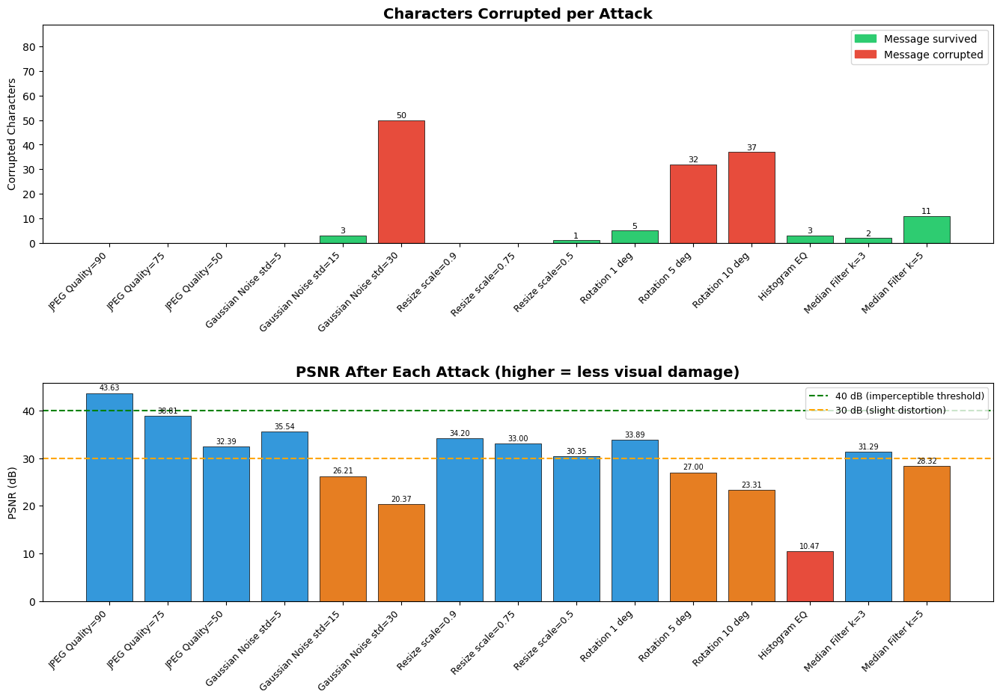

Chart saved as attack_results.png

===== FULL RESULTS SUMMARY =====
Attack                    Survived   Corrupted       PSNR       Extracted message
                                                                RAW: 'Hello, this is a secret message hidden with DCT and i am trying to hide ...'
JPEG Quality=90           YES        0/84            43.63      ECC: 'Hello, this is a secret message hidden with DCT and i am trying to hide ...'
                                                                RAW: 'Hello, this is a secret message hidden with DCT and i am trying to hide ...'
JPEG Quality=75           YES        0/84            38.81      ECC: 'Hello, this is a secret message hidden with DCT and i am trying to hide ...'
                                                                RAW: 'Hello, this is a secret message hidden with DCT and i am trying to hide ...'
JPEG Quality=50           YES        0/84            32.39      ECC: 'Hello, this is a secret message hidden with D

In [14]:
# ============================================================
# BLOCK 12: Visualize results
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# --- Chart 1: Corrupted characters per attack ---
names      = [r['name'] for r in results]
corrupted  = [r['corrupted_raw'] for r in results]
survived   = [r['survived'] for r in results]
psnr_vals  = [r['psnr'] if r['psnr'] != float('inf') else 60 for r in results]
colors     = ['#2ecc71' if s else '#e74c3c' for s in survived]

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Bar chart — corrupted characters
bars = axes[0].bar(names, corrupted, color=colors, edgecolor='black', linewidth=0.5)
axes[0].set_title('Characters Corrupted per Attack', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Corrupted Characters')
axes[0].set_xticks(range(len(names)))
axes[0].set_xticklabels(names, rotation=45, ha='right', fontsize=9)
axes[0].axhline(y=0, color='black', linewidth=0.8)
axes[0].set_ylim(0, len(SECRET_MESSAGE) + 5)

# Add value labels on bars
for bar, val in zip(bars, corrupted):
    if val > 0:
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                     str(val), ha='center', va='bottom', fontsize=8)

# Legend
green_patch = mpatches.Patch(color='#2ecc71', label='Message survived')
red_patch   = mpatches.Patch(color='#e74c3c', label='Message corrupted')
axes[0].legend(handles=[green_patch, red_patch])

# Bar chart — PSNR values
psnr_colors = ['#3498db' if p >= 30 else '#e67e22' if p >= 20 else '#e74c3c'
               for p in psnr_vals]
bars2 = axes[1].bar(names, psnr_vals, color=psnr_colors, edgecolor='black', linewidth=0.5)
axes[1].set_title('PSNR After Each Attack (higher = less visual damage)', fontsize=14, fontweight='bold')
axes[1].set_ylabel('PSNR (dB)')
axes[1].set_xticks(range(len(names)))
axes[1].set_xticklabels(names, rotation=45, ha='right', fontsize=9)
axes[1].axhline(y=40, color='green', linewidth=1.5, linestyle='--', label='40 dB (imperceptible threshold)')
axes[1].axhline(y=30, color='orange', linewidth=1.5, linestyle='--', label='30 dB (slight distortion)')
axes[1].legend(fontsize=9)

# Add PSNR value labels
for bar, val, r in zip(bars2, psnr_vals, results):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                 r['psnr_str'], ha='center', va='bottom', fontsize=7)

plt.tight_layout(pad=3.0)
plt.savefig('attack_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Chart saved as attack_results.png')

# --- Summary table ---
print('\n===== FULL RESULTS SUMMARY =====')
print(f'{"Attack":<25} {"Survived":<10} {"Corrupted":<15} {"PSNR":<10} {"Extracted message"}')
print('=' * 100)
for r in results:
    status     = 'YES' if r['survived'] else 'NO'
    corrupt    = f"{r['corrupted_raw']}/{r['total']}" if r['corrupted_raw'] >= 0 else 'ERROR'
    raw_result = r['extracted_raw'][:72] + '...' if len(r['extracted_raw']) > 35 else r['extracted_raw']
    ecc_result = r['extracted'][:72]     + '...' if len(r['extracted'])     > 35 else r['extracted']
    print(f"{'':25} {'':10} {'':15} {'':10} RAW: {repr(raw_result)}")
    print(f"{r['name']:<25} {status:<10} {corrupt:<15} {r['psnr_str']:<10} ECC: {repr(ecc_result)}")
    

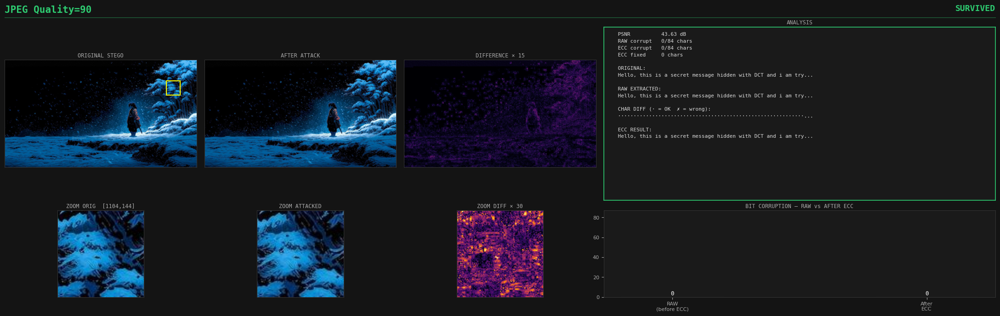

  saved → attacked_images/preview_JPEG_Quality90.png



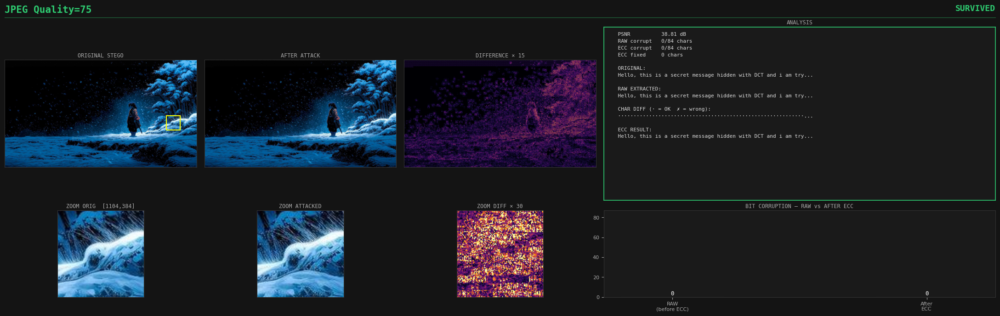

  saved → attacked_images/preview_JPEG_Quality75.png



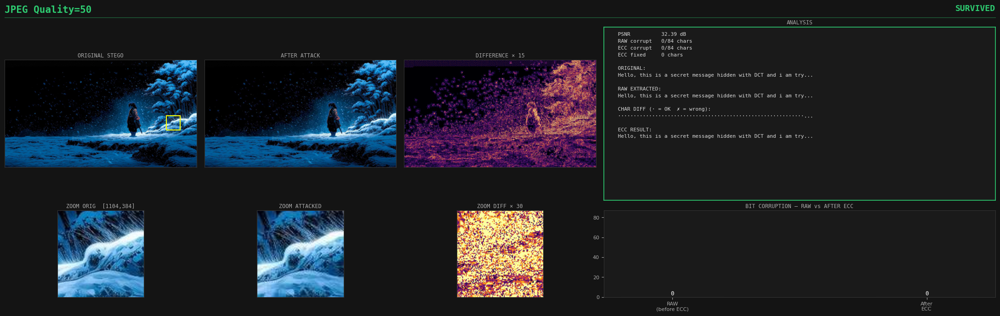

  saved → attacked_images/preview_JPEG_Quality50.png



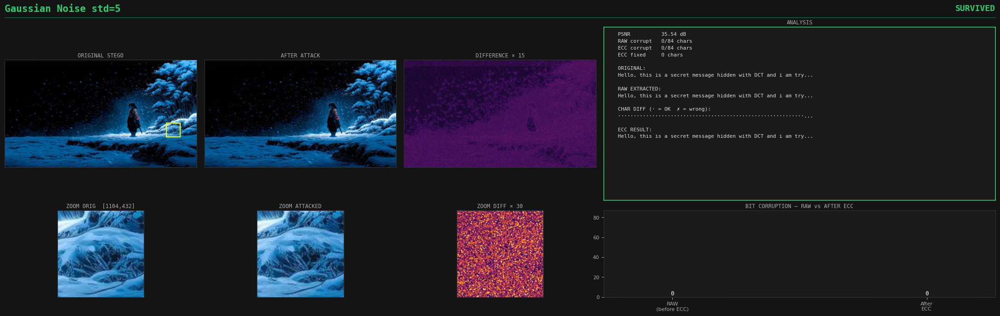

  saved → attacked_images/preview_Gaussian_Noise_std5.png



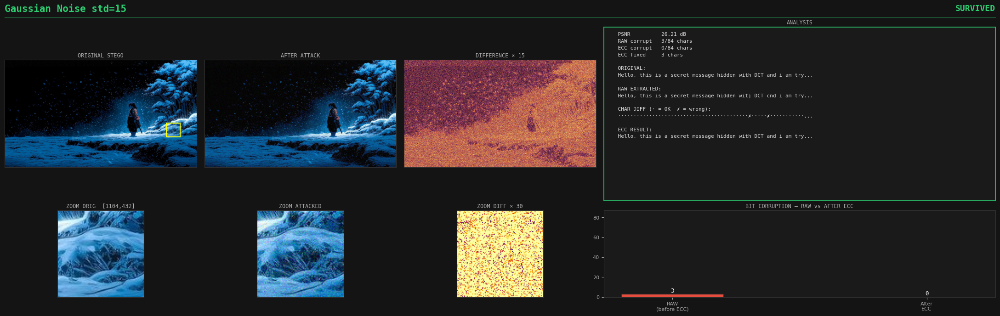

  saved → attacked_images/preview_Gaussian_Noise_std15.png



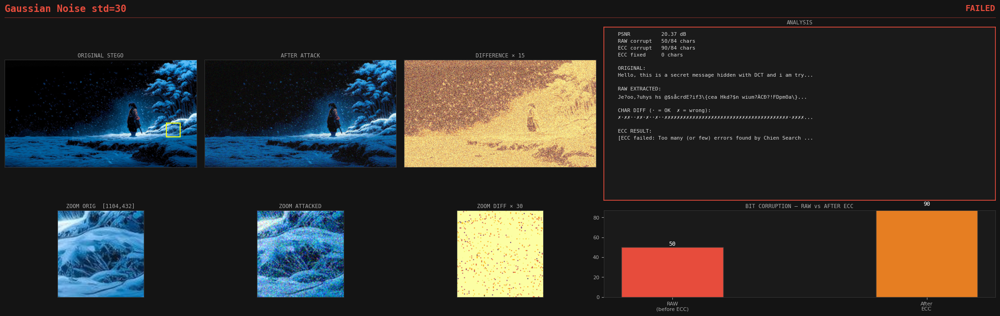

  saved → attacked_images/preview_Gaussian_Noise_std30.png



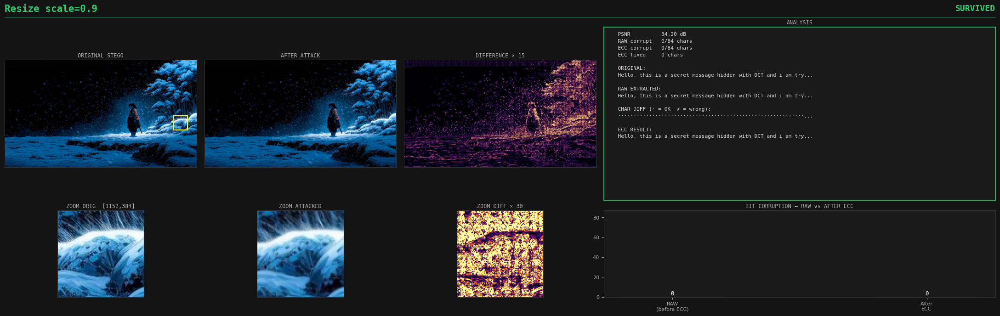

  saved → attacked_images/preview_Resize_scale0.9.png



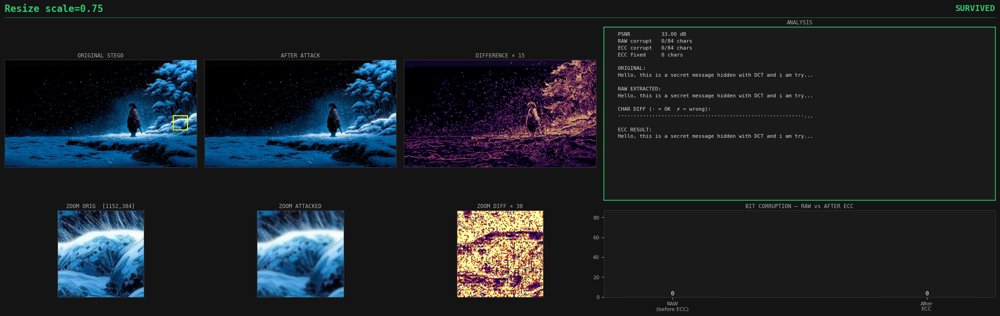

  saved → attacked_images/preview_Resize_scale0.75.png



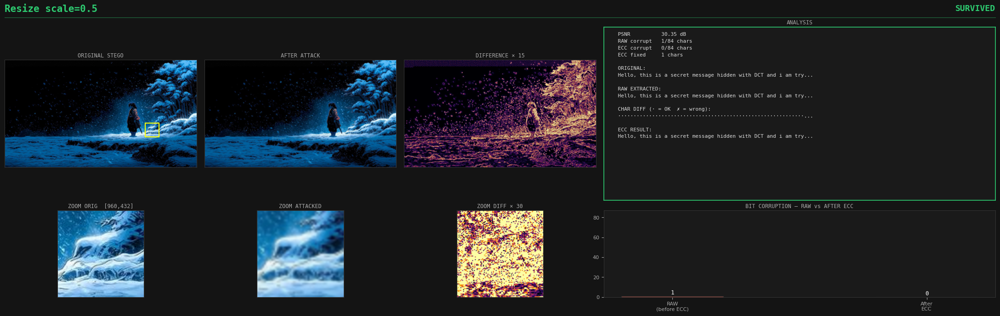

  saved → attacked_images/preview_Resize_scale0.5.png



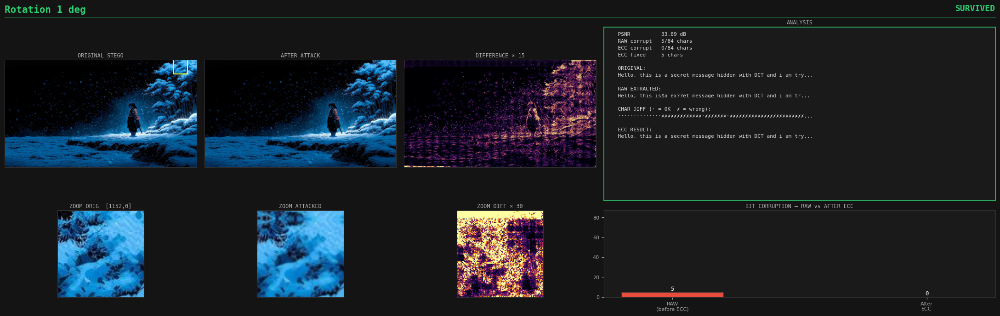

  saved → attacked_images/preview_Rotation_1_deg.png



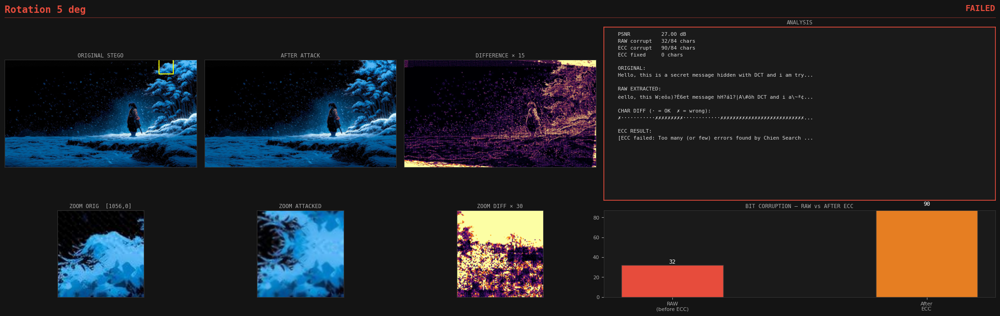

  saved → attacked_images/preview_Rotation_5_deg.png



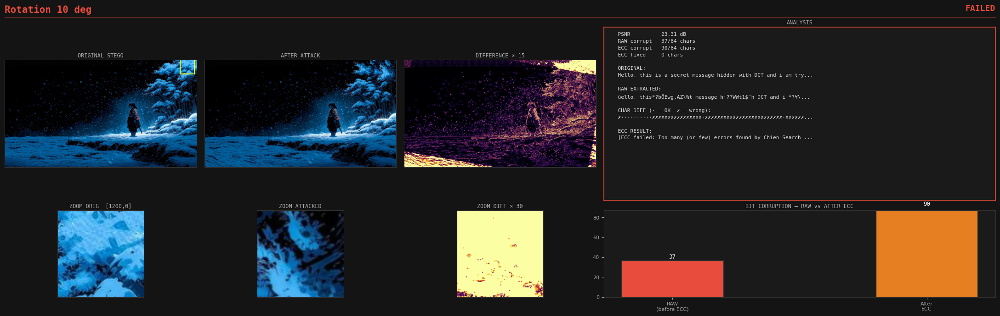

  saved → attacked_images/preview_Rotation_10_deg.png



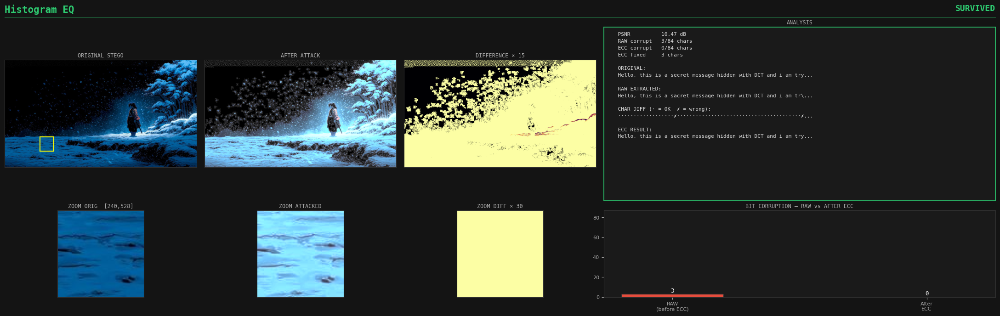

  saved → attacked_images/preview_Histogram_EQ.png



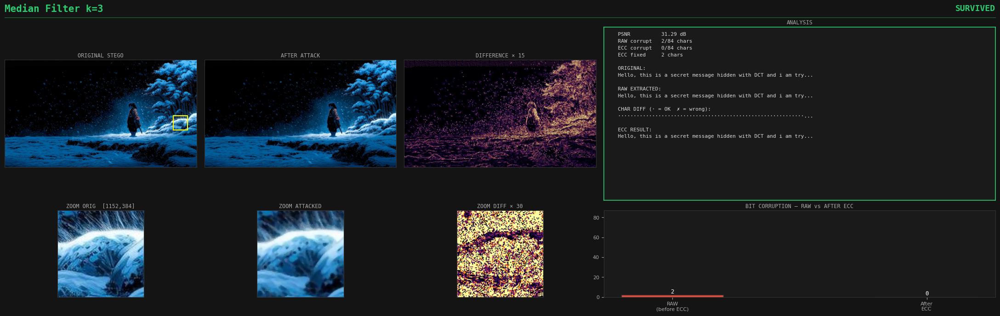

  saved → attacked_images/preview_Median_Filter_k3.png



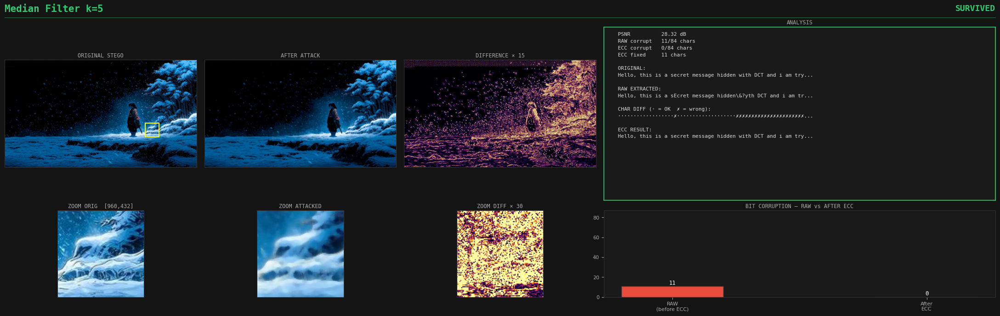

  saved → attacked_images/preview_Median_Filter_k5.png



In [19]:
# ============================================================
# BLOCK 13: Attack Visual Preview
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import numpy as np
import cv2
import os

plt.rcParams['text.usetex'] = False

def safe_text(s):
    """Replace non-printable chars and escape matplotlib special chars."""
    # First replace non-printable chars
    cleaned = ''.join(c if c.isprintable() else '?' for c in s)
    # Now escape on the whole string in the right order
    # Backslash must go first to avoid double-escaping
    cleaned = cleaned.replace('\\', '/')
    cleaned = cleaned.replace('$',  r'\$')
    cleaned = cleaned.replace('{',  r'\{')
    cleaned = cleaned.replace('}',  r'\}')
    cleaned = cleaned.replace('_',  r'\_')
    cleaned = cleaned.replace('^',  r'\^')
    cleaned = cleaned.replace('%',  r'\%')
    cleaned = cleaned.replace('#',  r'\#')
    cleaned = cleaned.replace('&',  r'\&')
    cleaned = cleaned.replace('~',  r'\~')
    return cleaned

def find_hottest_crop(diff_gray, crop=96):
    """Find the image region with the most change."""
    h, w = diff_gray.shape
    if h < crop or w < crop:
        return 0, 0
    best_y, best_x, best_val = 0, 0, 0
    step = crop // 2
    for y in range(0, h - crop, step):
        for x in range(0, w - crop, step):
            val = diff_gray[y:y+crop, x:x+crop].sum()
            if val > best_val:
                best_val = val
                best_y, best_x = y, x
    return best_y, best_x

stego_bgr = cv2.imread(STEGO_IMAGE_PATH)
stego_rgb = cv2.cvtColor(stego_bgr, cv2.COLOR_BGR2RGB)

for r in results:
    if not r['path'] or not os.path.exists(r['path']):
        print(f"Skipping {r['name']} — no image found")
        continue

    attacked_bgr = cv2.imread(r['path'])
    attacked_rgb = cv2.cvtColor(attacked_bgr, cv2.COLOR_BGR2RGB)

    # Align sizes
    h = min(stego_rgb.shape[0], attacked_rgb.shape[0])
    w = min(stego_rgb.shape[1], attacked_rgb.shape[1])
    orig = stego_rgb[:h, :w]
    atk  = attacked_rgb[:h, :w]

    # Difference — grayscale, amplified heatmap
    diff_gray = np.abs(atk.astype(np.int32) - orig.astype(np.int32)).mean(axis=2)
    diff_heat = np.clip(diff_gray * 15, 0, 255).astype(np.uint8)

    # Find zoom region
    CROP = 96
    cy, cx = find_hottest_crop(diff_gray, CROP)
    zoom_orig = orig[cy:cy+CROP, cx:cx+CROP]
    zoom_atk  = atk[cy:cy+CROP, cx:cx+CROP]
    zoom_diff = np.clip(diff_gray[cy:cy+CROP, cx:cx+CROP] * 30, 0, 255).astype(np.uint8)

    # ── Layout ────────────────────────────────────────────────
    survived      = r['survived']
    accent        = '#2ecc71' if survived else '#e74c3c'
    status_label  = 'SURVIVED' if survived else 'FAILED'
    bg            = '#141414'

    fig = plt.figure(figsize=(22, 7), facecolor=bg)
    fig.patch.set_facecolor(bg)

    # Title bar
    fig.text(0.01, 0.97, r['name'],
             fontsize=15, fontweight='bold', color=accent,
             va='top', fontfamily='monospace')
    fig.text(0.99, 0.97, status_label,
             fontsize=13, fontweight='bold', color=accent,
             va='top', ha='right', fontfamily='monospace')

    # Horizontal rule under title
    fig.add_artist(plt.Line2D([0.01, 0.99], [0.93, 0.93],
                              color=accent, linewidth=0.8, alpha=0.5,
                              transform=fig.transFigure))

    gs = gridspec.GridSpec(
        2, 5,
        figure=fig,
        top=0.90, bottom=0.06,
        left=0.01, right=0.99,
        hspace=0.08, wspace=0.04,
        height_ratios=[2, 1]
    )

    def make_ax(row, col, title):
        ax = fig.add_subplot(gs[row, col])
        ax.set_facecolor(bg)
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor('#333333')
            spine.set_linewidth(0.8)
        ax.set_title(title, color='#aaaaaa', fontsize=8.5,
                     fontfamily='monospace', pad=4)
        return ax

    # Row 0: full images
    ax_orig = make_ax(0, 0, 'ORIGINAL STEGO')
    ax_atk  = make_ax(0, 1, 'AFTER ATTACK')
    ax_diff = make_ax(0, 2, 'DIFFERENCE × 15')
    ax_info = fig.add_subplot(gs[0, 3:5])
    ax_info.set_facecolor('#1a1a1a')
    ax_info.set_xticks([])
    ax_info.set_yticks([])
    for spine in ax_info.spines.values():
        spine.set_edgecolor(accent)
        spine.set_linewidth(1.2)
    ax_info.set_title('ANALYSIS', color='#aaaaaa', fontsize=8.5,
                      fontfamily='monospace', pad=4)

    # Row 1: zoom panels
    ax_zorig = make_ax(1, 0, f'ZOOM ORIG  [{cx},{cy}]')
    ax_zatk  = make_ax(1, 1, f'ZOOM ATTACKED')
    ax_zdiff = make_ax(1, 2, 'ZOOM DIFF × 30')

    # Pixel-level difference bar (row 1, col 3-4)
    ax_bar = fig.add_subplot(gs[1, 3:5])
    ax_bar.set_facecolor('#1a1a1a')
    for spine in ax_bar.spines.values():
        spine.set_edgecolor('#333333')
    ax_bar.set_title('BIT CORRUPTION — RAW vs AFTER ECC',
                     color='#aaaaaa', fontsize=8.5, fontfamily='monospace', pad=4)

    # ── Draw images ───────────────────────────────────────────
    ax_orig.imshow(orig)
    # Draw zoom box on original
    rect = mpatches.FancyBboxPatch(
        (cx, cy), CROP, CROP,
        boxstyle='square,pad=0',
        linewidth=1.5, edgecolor='yellow', facecolor='none'
    )
    ax_orig.add_patch(rect)

    ax_atk.imshow(atk)
    ax_diff.imshow(diff_heat, cmap='inferno', vmin=0, vmax=255)

    ax_zorig.imshow(zoom_orig)
    ax_zatk.imshow(zoom_atk)
    ax_zdiff.imshow(zoom_diff, cmap='inferno', vmin=0, vmax=255)

    # ── Info panel ────────────────────────────────────────────
    raw_preview = safe_text(r['extracted_raw'])
    ecc_preview = safe_text(r['extracted'])
    orig_msg    = safe_text(SECRET_MESSAGE)

    # Compute per-character diff string for RAW
    diff_str = ''
    for o, e in zip(orig_msg, raw_preview):
        diff_str += ('·' if o == e else '✗')
    diff_str = diff_str[:60] + ('...' if len(orig_msg) > 60 else '')

    lines = [
        f"  PSNR          {r['psnr_str']} dB",
        f"  RAW corrupt   {r['corrupted_raw']}/{r['total']} chars",
        f"  ECC corrupt   {r['corrupted']}/{r['total']} chars",
        f"  ECC fixed     {max(0, r['corrupted_raw'] - r['corrupted'])} chars",
        f"",
        f"  ORIGINAL:",
        f"  {orig_msg[:60]}{'...' if len(orig_msg)>60 else ''}",
        f"",
        f"  RAW EXTRACTED:",
        f"  {raw_preview[:60]}{'...' if len(raw_preview)>60 else ''}",
        f"",
        f"  CHAR DIFF (· = OK  ✗ = wrong):",
        f"  {diff_str}",
        f"",
        f"  ECC RESULT:",
        f"  {ecc_preview[:60]}{'...' if len(ecc_preview)>60 else ''}",
    ]

    ax_info.text(
        0.02, 0.97,
        '\n'.join(lines),
        transform=ax_info.transAxes,
        fontsize=8, verticalalignment='top',
        fontfamily='monospace', color='#dddddd',
        linespacing=1.6
    )

    # ── Corruption bar chart ──────────────────────────────────
    bar_labels = ['RAW\n(before ECC)', 'After\nECC']
    bar_vals   = [r['corrupted_raw'], max(0, r['corrupted'])]
    bar_colors = ['#e74c3c', '#2ecc71' if bar_vals[1] == 0 else '#e67e22']
    bars = ax_bar.bar(bar_labels, bar_vals, color=bar_colors,
                      edgecolor='#333333', width=0.4)
    ax_bar.set_ylim(0, r['total'] + 3)
    ax_bar.tick_params(colors='#aaaaaa', labelsize=8)
    ax_bar.set_facecolor('#1a1a1a')
    for spine in ax_bar.spines.values():
        spine.set_edgecolor('#333333')
    ax_bar.yaxis.label.set_color('#aaaaaa')
    for bar, val in zip(bars, bar_vals):
        ax_bar.text(bar.get_x() + bar.get_width()/2,
                    bar.get_height() + 0.3,
                    str(val), ha='center', va='bottom',
                    color='white', fontsize=9, fontfamily='monospace')

    # Save
    save_name = r['name'].replace(' ', '_').replace('=', '').replace('/', '')
    save_path = f"{ATTACK_DIR}/preview_{save_name}.png"
    plt.savefig(save_path, dpi=120, bbox_inches='tight', facecolor=bg)
    plt.show()
    plt.close()
    print(f"  saved → {save_path}\n")